# Explonatary Data Analysis

In [1]:
import os
import pandas as pd
import librosa
import numpy as np
import matplotlib.pyplot as plt

# Configs
TRAIN_CSV_PATH = "dataset/Train.csv"
TRAIN_AUDIO_DIR = "dataset/Train/"

# Load CSV
df = pd.read_csv(TRAIN_CSV_PATH)
df["filepath"] = df["file_name"].apply(lambda x: os.path.join(TRAIN_AUDIO_DIR, x))

# Show first few rows
df.head()


,file_name,classID,filepath
0,data_0.wav,3,dataset/Train/data_0.wav
1,data_1.wav,3,dataset/Train/data_1.wav
2,data_2.wav,3,dataset/Train/data_2.wav
3,data_3.wav,3,dataset/Train/data_3.wav
4,data_4.wav,6,dataset/Train/data_4.wav


In [2]:
# Check for missing files
missing = [f for f in df["filepath"] if not os.path.exists(f)]
print("Missing files:", len(missing))

# Class distribution
print("\nClass distribution:")
print(df["classID"].value_counts().sort_index())


Missing files: 0

Class distribution:
classID
0    800
1    368
2    800
3    800
4    800
5    801
6    291
7    828
8    769
9    800
Name: count, dtype: int64


Analyzing durations: 100%|██████████| 7057/7057 [02:14<00:00, 52.63it/s]


count    7057.000000
mean        3.598708
std         0.987307
min         0.050000
25%         4.000000
50%         4.000000
75%         4.000000
max         4.036647
Name: duration_sec, dtype: float64


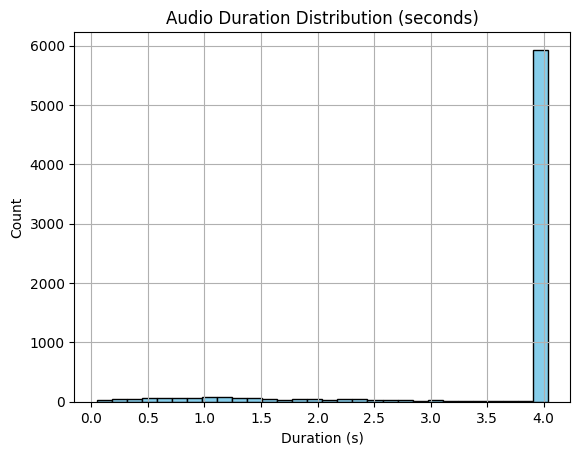

In [3]:
from tqdm import tqdm

durations = []

for path in tqdm(df["filepath"], desc="Analyzing durations"):
    try:
        y, sr = librosa.load(path, sr=None)
        durations.append(len(y) / sr)
    except Exception as e:
        print(f"[ERROR] {path}: {e}")
        durations.append(0)

df["duration_sec"] = durations

# Summary stats
print(df["duration_sec"].describe())

# Plot
plt.hist(df["duration_sec"], bins=30, color='skyblue', edgecolor='black')
plt.title("Audio Duration Distribution (seconds)")
plt.xlabel("Duration (s)")
plt.ylabel("Count")
plt.grid(True)
plt.show()


In [31]:
from IPython.display import Audio, display
import random
import librosa

def play_random_samples_per_class(df, n_per_class=2):
    print(f"Playing {n_per_class} random samples from each class...\n")
    
    for class_id in sorted(df["classID"].unique()):
        print(f"\nClass {class_id}:\n" + "-"*30)
        samples = df[df["classID"] == class_id].sample(n=min(n_per_class, len(df[df["classID"] == class_id])))
        
        for idx, row in samples.iterrows():
            print(f" - {row['file_name']}")
            try:
                y, sr = librosa.load(row["filepath"], sr=None)
                display(Audio(data=y, rate=sr))
            except Exception as e:
                print(f" [Error loading {row['file_name']}]: {e}")

# Usage
play_random_samples_per_class(df, n_per_class=2)


🔊 Playing 2 random samples from each class...


Class 0:
------------------------------
 - data_4955.wav


 - data_6978.wav



Class 1:
------------------------------
 - data_6657.wav


 - data_2068.wav



Class 2:
------------------------------
 - data_3496.wav


 - data_4348.wav



Class 3:
------------------------------
 - data_3634.wav


 - data_4375.wav



Class 4:
------------------------------
 - data_683.wav


 - data_5222.wav



Class 5:
------------------------------
 - data_6700.wav


 - data_5450.wav



Class 6:
------------------------------
 - data_3956.wav


 - data_1520.wav



Class 7:
------------------------------
 - data_2752.wav


 - data_3745.wav



Class 8:
------------------------------
 - data_4988.wav


 - data_2286.wav



Class 9:
------------------------------
 - data_6830.wav


 - data_5507.wav



---

###  Human-Level Class Summary

| Class ID | Description (Based on Listening)                    |
|----------|-----------------------------------------------------|
| **0**    | Background noise / birds / water / miscellaneous 🌳🌊🐦 |
| **1**    | **Traffic**: cars, horns 🚗📣                         |
| **2**    | **Outdoor/park** ambience: talking, kids 🎠👨‍👩‍👧       |
| **3**    | **Dog barking** 🐕                                     |
| **4**    | **Machine** noise: screwing, wall drilling 🔧🔩       |
| **5**    | **Engine revving** 🚗                                 |
| **6**    | **Gun shot** 🔫                                       |
| **7**    | **Drill machine**, loud drilling 🛠️                  |
| **8**    | **Siren**: police, ambulance 🚨                       |
| **9**    | **Music**, often short: violin, ambient 🎻🎶         |

---


Plotting waveform and spectrogram grid...


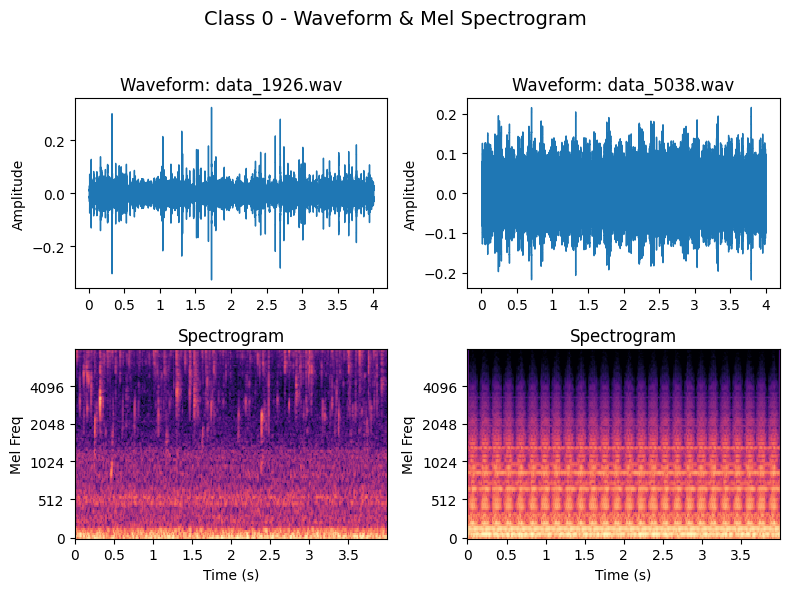

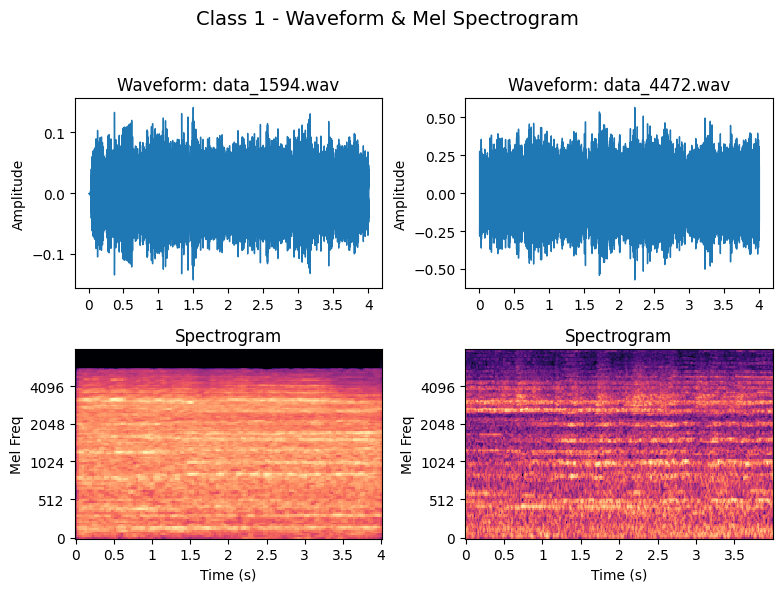

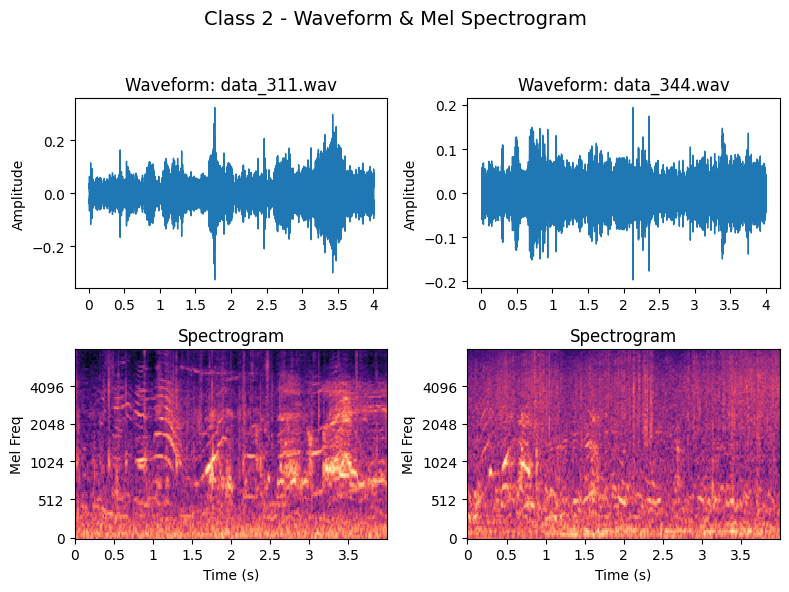

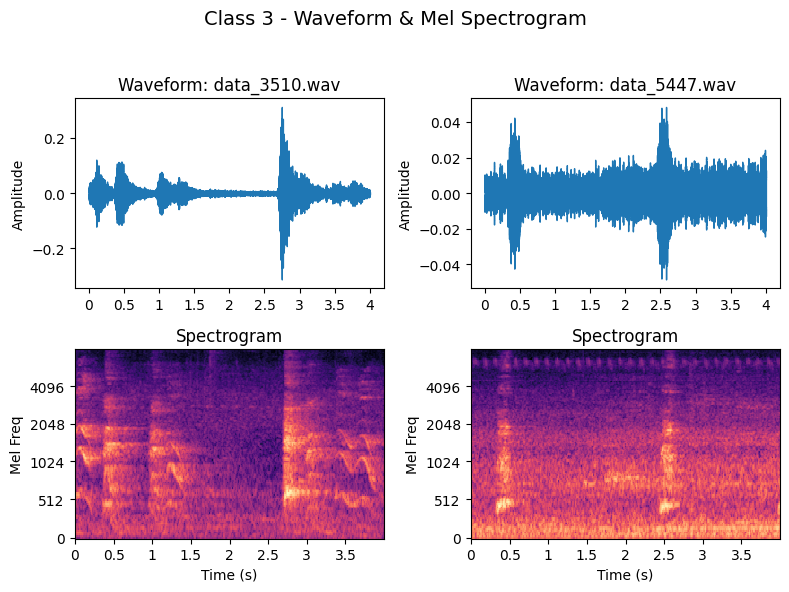

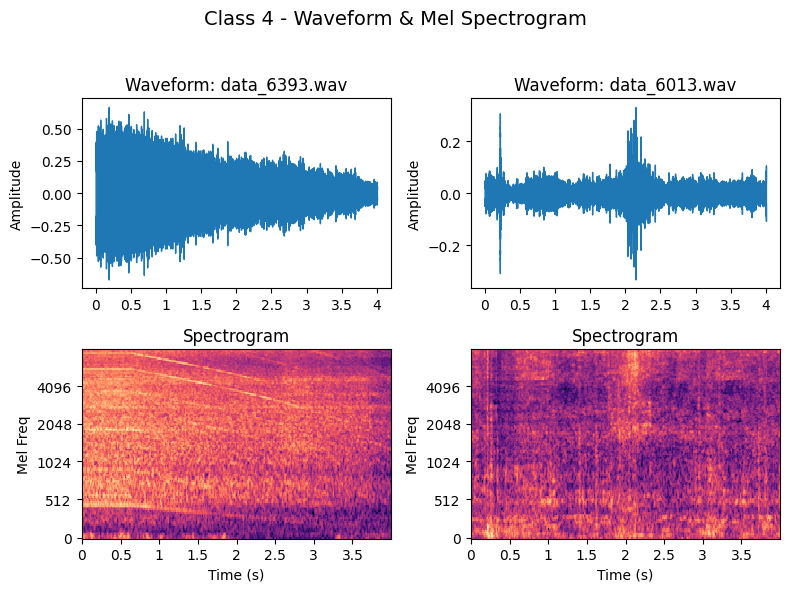

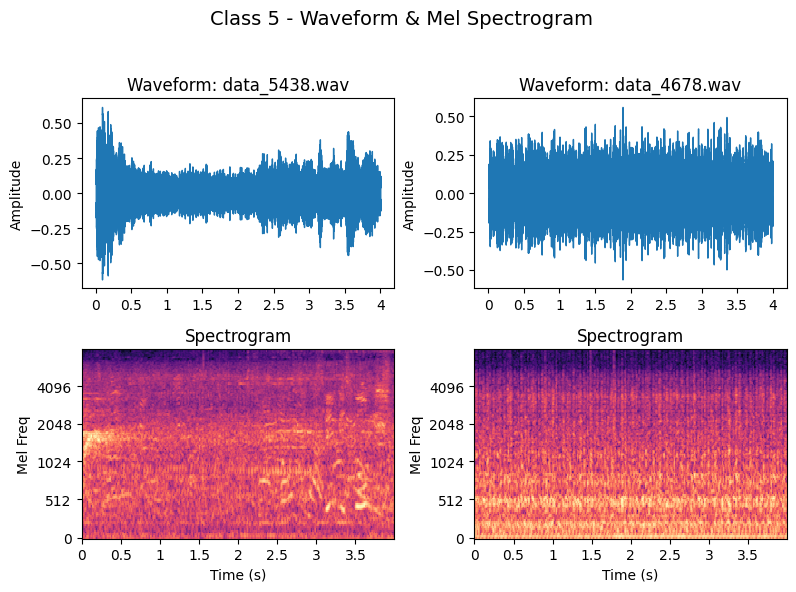

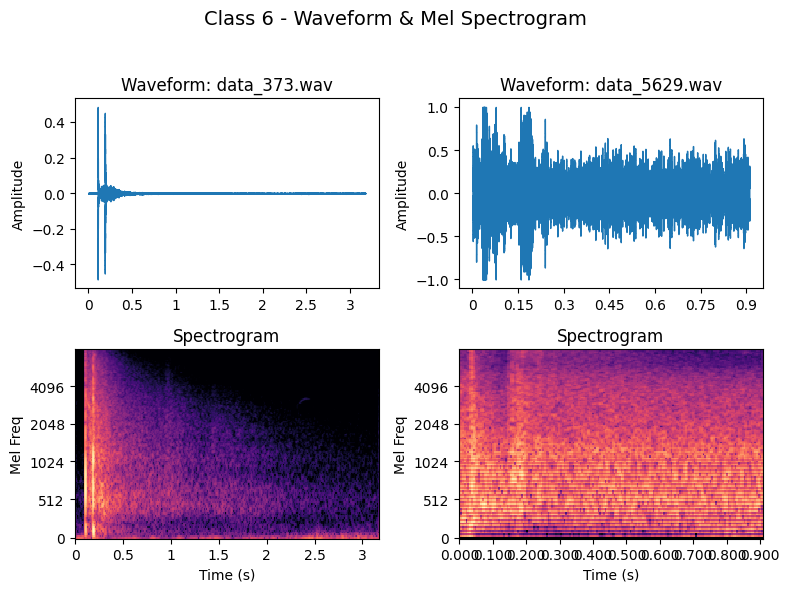

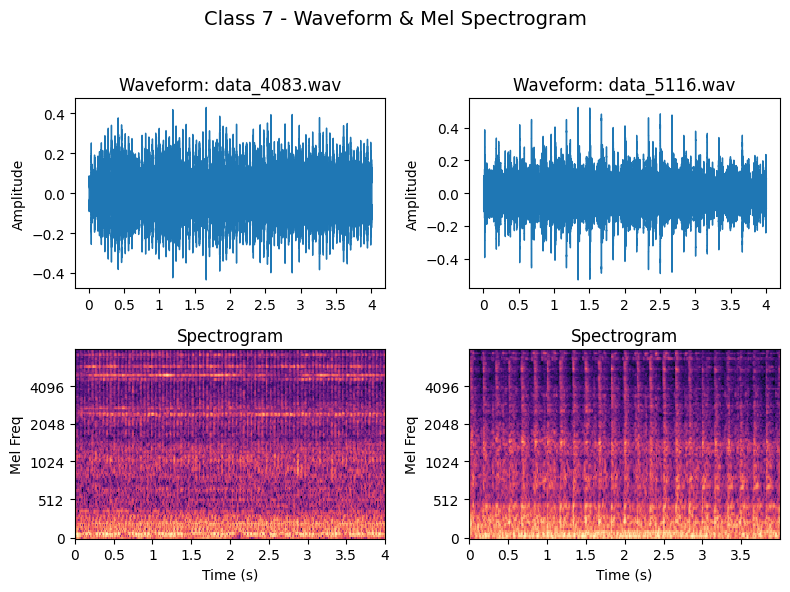

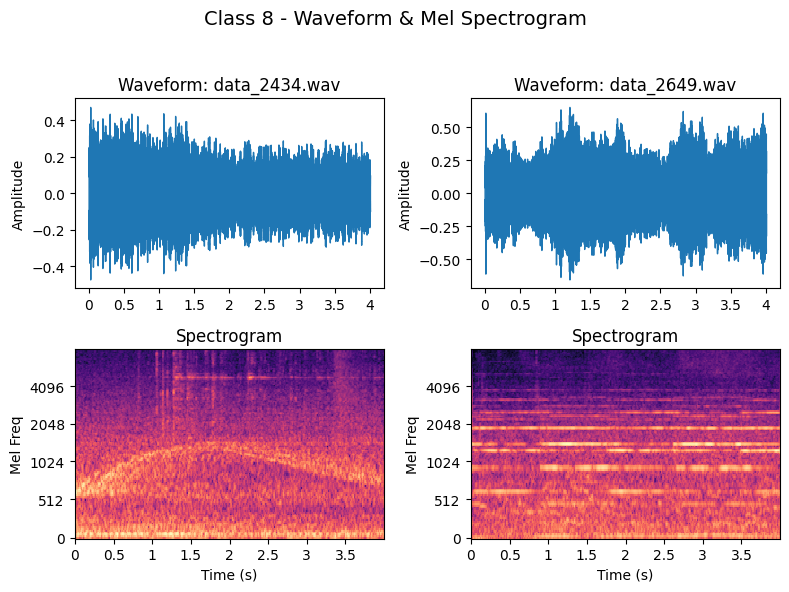

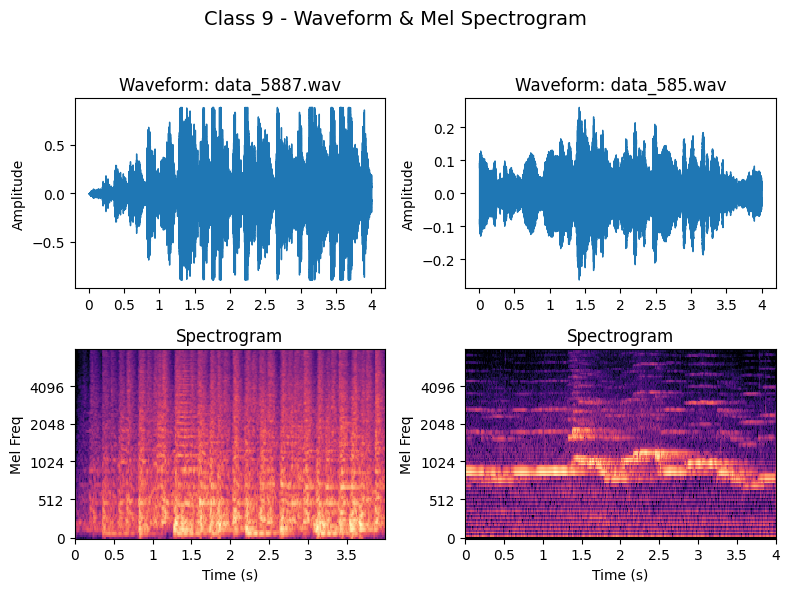

In [32]:
import matplotlib.pyplot as plt
import librosa.display

def plot_waveform_and_spectrogram_grid(df, samples_per_class=2):
    print("Plotting waveform and spectrogram grid...")

    for class_id in sorted(df["classID"].unique()):
        class_df = df[df["classID"] == class_id].sample(samples_per_class, random_state=np.random.randint(10000))
        fig, axes = plt.subplots(2, samples_per_class, figsize=(samples_per_class * 4, 6))
        fig.suptitle(f"Class {class_id} - Waveform & Mel Spectrogram", fontsize=14)

        for i, (_, row) in enumerate(class_df.iterrows()):
            # Load audio
            y, sr = librosa.load(row["filepath"], sr=None)
            mel = librosa.feature.melspectrogram(y=y, sr=sr, n_mels=128, fmax=8000)
            mel_db = librosa.power_to_db(mel, ref=np.max)

            # Plot waveform
            librosa.display.waveshow(y, sr=sr, ax=axes[0, i])
            axes[0, i].set_title(f"Waveform: {row['file_name']}")
            axes[0, i].set_xlabel('')
            axes[0, i].set_ylabel('Amplitude')

            # Plot spectrogram
            img = librosa.display.specshow(mel_db, sr=sr, x_axis='time', y_axis='mel', fmax=8000, ax=axes[1, i], cmap='magma')
            axes[1, i].set_title(f"Spectrogram")
            axes[1, i].set_xlabel('Time (s)')
            axes[1, i].set_ylabel('Mel Freq')

        plt.tight_layout(rect=[0, 0, 1, 0.95])
        plt.show()

# Usage:
plot_waveform_and_spectrogram_grid(df, samples_per_class=2)



---

###  What these plots are telling us (at a glance):

####  **Class Separation Potential**
- **Class 3 (barking)** and **Class 6 (gunshot)** have really **distinct patterns** in both waveform and spectrogram — good candidates for **high precision**.
- **Class 5 (engine revving)** and **Class 7 (drilling)** seem like they might share **repetitive high-energy frequency bands**, which aligns with your earlier note: **they’re hard to separate**. Definitely a key challenge class pair.

####  **Class Ambiguity**
- **Class 0** is wild — looks like a **dump bin of random ambient noise** (possibly birds, water, wind, static…). Might need special handling or even filtering based on spectrum energy distribution.
- **Class 1 & 2** have **broadband frequency content** but more consistent across time. Maybe more consistent "scenes" like traffic or parks.

####  **Class 9 (music)** 
Interesting variations — in the spectrograms you can see **harmonics and tonal structures** (especially in the right sample). This will help distinguish it from more chaotic classes.

---


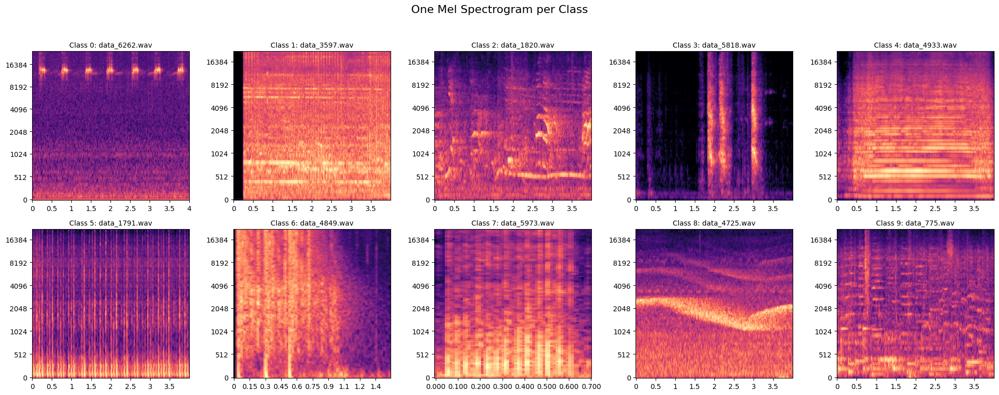

In [35]:
import matplotlib.pyplot as plt
import librosa.display

fig, axes = plt.subplots(2, 5, figsize=(20, 8))
fig.suptitle("One Mel Spectrogram per Class", fontsize=16)

for class_id in sorted(df["classID"].unique()):
    ax = axes[class_id // 5][class_id % 5]
    sample = df[df["classID"] == class_id].sample(1).iloc[0]
    y, sr = librosa.load(sample["filepath"], sr=None)
    S = librosa.feature.melspectrogram(y=y, sr=sr, n_mels=128, fmax=8000)
    S_db = librosa.power_to_db(S, ref=np.max)

    librosa.display.specshow(S_db, sr=sr, x_axis='time', y_axis='mel', ax=ax, cmap='magma')
    ax.set_title(f'Class {class_id}: {sample["file_name"]}', fontsize=10)
    ax.set_xlabel("")
    ax.set_ylabel("")

plt.tight_layout(rect=[0, 0, 1, 0.95])
plt.show()




---

## ✅ Summary of EDA Insights

### 🔊 **General Observations**
- Most audios are around **4 seconds long** — perfect for consistent input sizing.
- Audio sampling rate and quality appear **high and uniform** — we can likely use the raw waveform or Mel spectrograms with minimal pre-cleaning.

### 📊 **Class-wise Highlights**
- **Class 3 (barking)**, **Class 6 (gunshot)**, and **Class 8 (siren)** have **distinct and sharp patterns** → likely to be learned easily.
- **Class 0** = ambiguous ambient noise → may require special treatment (e.g. thresholding, pre-clustering).
- **Class 5 & 7** = similar high-frequency dominant patterns → likely source of confusion, especially under real-world noise.

---

## 🚀 Project Roadmap & Requirements

### 🎯 **Goal**
> Build a deep learning pipeline that can classify environmental sounds into 10 categories with at least **90% accuracy**, while keeping the model lightweight and generalizable.

---

### 📦 Step 1: Data Preparation
- [x] Audio duration + missing file check
- [x] Class distribution analysis (note: **class 6 & class 1 are minority classes**)
- [x] Visual/audio inspection of examples per class
- [ ] ✅ Normalize audio length if needed (padding/trimming)
- [ ] ✅ Standardize sample rate 

---

### 🧪 Step 2: Feature Engineering
- [x] Mel spectrograms (proven helpful via visual EDA)
- [ ] Optionally: Test log-Mel spectrogram or MFCC
- [ ] Add augmentation: time shift, pitch shift, noise overlay, spec augment

---

### 🧠 Step 3: Model Design
- [ ] Start with **CNN-based architecture** (ResNet-like or Conv + GRU)
- [ ] Consider **transfer learning** from VGGish or YAMNet
- [ ] Input shape = (mel_bins, time_steps, 1)

---

### ⚙️ Step 4: Training Strategy
- [ ] Use **Stratified train/val split** or balanced sampling
- [ ] Include **class weighting** or **focal loss** if imbalance hurts performance
- [ ] Early stopping, model checkpointing
- [ ] Evaluate confusion matrix to handle class 5 vs 7 confusion

---

### 📈 Step 5: Evaluation
- [ ] Precision, Recall, F1 per class
- [ ] Top-N accuracy for close class confusion
- [ ] Visualize learned embeddings (e.g. via t-SNE or PCA)

---

### 🧪 Step 6 (Optional): Post-training
- [ ] Quantization for mobile or embedded use
- [ ] Export to TF Lite or ONNX
- [ ] Real-time streaming classifier

---
